# Objective

The dataset belongs to a leading life insurance company. The company wants to 
predict the bonus for its agents so that it may design appropriate engagement activity 
for their high performing agents and upskill programs for low performing agents.

# Import Libraries

In [1]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import sklearn.metrics as metrics
#import warnings
#warning.filterwarnings("ignore")
%matplotlib inline

In [2]:
print('Numpy Version',np.__version__)
print('Pandas Version',pd.__version__)
print('Seaborn Version',sns.__version__)
print('Matplotlib Version',matplotlib.__version__)

Numpy Version 1.16.5
Pandas Version 0.25.1
Seaborn Version 0.11.2
Matplotlib Version 3.1.1


# Import Data

In [3]:
df=pd.read_excel('Sales_Data_EDA.xlsx',sheet_name='Sales')

# Data Info - Types of Features

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4520 entries, 0 to 4519
Data columns (total 20 columns):
CustID                  4520 non-null int64
AgentBonus              4520 non-null int64
Age                     4251 non-null float64
CustTenure              4294 non-null float64
Channel                 4520 non-null object
Occupation              4520 non-null object
EducationField          4520 non-null object
Gender                  4520 non-null object
ExistingProdType        4520 non-null int64
Designation             4520 non-null object
NumberOfPolicy          4475 non-null float64
MaritalStatus           4520 non-null object
MonthlyIncome           4284 non-null float64
Complaint               4520 non-null int64
ExistingPolicyTenure    4336 non-null float64
SumAssured              4366 non-null float64
Zone                    4520 non-null object
PaymentMethod           4520 non-null object
LastMonthCalls          4520 non-null int64
CustCareScore           4468 non-null

# Data Head

In [5]:
df.head(11).T

,0,1,2,3,4,5,6,7,8,9,10
CustID,7000000,7000001,7000002,7000003,7000004,7000005,7000006,7000007,7000008,7000009,7000010
AgentBonus,4409,2214,4273,1791,2955,3252,3850,2073,2719,3247,6676
Age,22,11,26,11,6,7,12,6,8,6,20
CustTenure,4,2,4,NaN,NaN,NaN,23,4,11,3,7
Channel,Agent,Third Party Partner,Agent,Third Party Partner,Agent,Third Party Partner,Agent,Agent,Agent,Online,Online
Occupation,Salaried,Salaried,Free Lancer,Salaried,Small Business,Salaried,Salaried,Small Business,Salaried,Small Business,Small Business
EducationField,Graduate,Graduate,Post Graduate,Graduate,UG,Graduate,Graduate,Under Graduate,Graduate,Under Graduate,Under Graduate
Gender,Female,Male,Male,Fe male,Male,Male,Male,Female,Male,Male,Male
ExistingProdType,3,4,4,3,3,3,4,3,4,2,4
Designation,Manager,Manager,Exe,Executive,Executive,Executive,VP,Executive,Manager,Exe,AVP


In [6]:
# change education field, existing prod type (type=>version), Payment Method (), 

In [7]:
df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
CustID,4520,NaN,NaN,NaN,7.00226e+06,1304.96,7e+06,7.00113e+06,7.00226e+06,7.00339e+06,7.00452e+06
AgentBonus,4520,NaN,NaN,NaN,4077.84,1403.32,1605,3027.75,3911.5,4867.25,9608
Age,4251,NaN,NaN,NaN,14.4947,9.03763,2,7,13,20,58
CustTenure,4294,NaN,NaN,NaN,14.469,8.96367,2,7,13,20,57
Channel,4520,3,Agent,3194,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Occupation,4520,5,Salaried,2192,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EducationField,4520,7,Graduate,1870,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Gender,4520,3,Male,2688,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ExistingProdType,4520,NaN,NaN,NaN,3.68894,1.01577,1,3,4,4,6
Designation,4520,6,Manager,1620,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# Check shape of data

In [9]:
print('The number of rows (observations) is',df.shape[0],'\n''The number of columns (variables) is',df.shape[1])

The number of rows (observations) is 4520 
The number of columns (variables) is 20


# Measures of Central Tendency

In [7]:
pd.set_option('max_rows', None)
pd.options.display.float_format = '{:.2f}'.format   
df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
CustID,4520.00,NaN,NaN,NaN,7002259.50,1304.96,7000000.00,7001129.75,7002259.50,7003389.25,7004519.00
AgentBonus,4520.00,NaN,NaN,NaN,4077.84,1403.32,1605.00,3027.75,3911.50,4867.25,9608.00
Age,4251.00,NaN,NaN,NaN,14.49,9.04,2.00,7.00,13.00,20.00,58.00
CustTenure,4294.00,NaN,NaN,NaN,14.47,8.96,2.00,7.00,13.00,20.00,57.00
Channel,4520,3,Agent,3194,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Occupation,4520,5,Salaried,2192,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EducationField,4520,7,Graduate,1870,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Gender,4520,3,Male,2688,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ExistingProdType,4520.00,NaN,NaN,NaN,3.69,1.02,1.00,3.00,4.00,4.00,6.00
Designation,4520,6,Manager,1620,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [10]:
# get the unique values of categorical data set
for columns in df.columns:
    if df[columns].dtypes =="object":
        print(columns, " ----- " , df[columns].unique())

Channel  -----  ['Agent' 'Third Party Partner' 'Online']
Occupation  -----  ['Salaried' 'Free Lancer' 'Small Business' 'Laarge Business'
 'Large Business']
EducationField  -----  ['Graduate' 'Post Graduate' 'UG' 'Under Graduate' 'Engineer' 'Diploma'
 'MBA']
Gender  -----  ['Female' 'Male' 'Fe male']
Designation  -----  ['Manager' 'Exe' 'Executive' 'VP' 'AVP' 'Senior Manager']
MaritalStatus  -----  ['Single' 'Divorced' 'Unmarried' 'Married']
Zone  -----  ['North' 'West' 'East' 'South']
PaymentMethod  -----  ['Half Yearly' 'Yearly' 'Quarterly' 'Monthly']


# Unique Value of Categorical Variables

In [8]:
for column in df.columns:
    if df[column].dtype == 'object':
        print(column,': ',df[column].nunique())
        print(df[column].value_counts().sort_values())
        print('\n')

Channel :  3
Online                  468
Third Party Partner     858
Agent                  3194
Name: Channel, dtype: int64


Occupation :  5
Free Lancer           2
Laarge Business     153
Large Business      255
Small Business     1918
Salaried           2192
Name: Occupation, dtype: int64


EducationField :  7
MBA                 74
UG                 230
Post Graduate      252
Engineer           408
Diploma            496
Under Graduate    1190
Graduate          1870
Name: EducationField, dtype: int64


Gender :  3
Fe male     325
Female     1507
Male       2688
Name: Gender, dtype: int64


Designation :  6
Exe                127
VP                 226
AVP                336
Senior Manager     676
Executive         1535
Manager           1620
Name: Designation, dtype: int64


MaritalStatus :  4
Unmarried     194
Divorced      804
Single       1254
Married      2268
Name: MaritalStatus, dtype: int64


Zone :  4
South       6
East       64
North    1884
West     2566
Name: Zone, dty

In [9]:
for i in df.columns:
    if(df[i].dtype == 'object'):
        print(i, ":" , df[i].unique())

Channel : ['Agent' 'Third Party Partner' 'Online']
Occupation : ['Salaried' 'Free Lancer' 'Small Business' 'Laarge Business'
 'Large Business']
EducationField : ['Graduate' 'Post Graduate' 'UG' 'Under Graduate' 'Engineer' 'Diploma'
 'MBA']
Gender : ['Female' 'Male' 'Fe male']
Designation : ['Manager' 'Exe' 'Executive' 'VP' 'AVP' 'Senior Manager']
MaritalStatus : ['Single' 'Divorced' 'Unmarried' 'Married']
Zone : ['North' 'West' 'East' 'South']
PaymentMethod : ['Half Yearly' 'Yearly' 'Quarterly' 'Monthly']


# Variable Transformation

In [10]:
#replacing the duplicate words in Gender, Occupation, EducationField & Designation variable

df.Gender.replace('Fe male', 'Female', inplace = True)
print(df.Gender.unique())

df.Occupation.replace('Laarge Business', 'Large Business', inplace = True)
print(df.Occupation.unique())


df.EducationField.replace('UG', 'Under Graduate', inplace = True)
print(df.EducationField.unique())

df.MaritalStatus.replace('Single', 'Single/Unmarried', inplace = True)


df.MaritalStatus.replace('Unmarried', 'Single/Unmarried', inplace = True)
print(df.MaritalStatus.unique())


df.Designation.replace('Exe', 'Executive', inplace = True)


df.Designation.replace('VP', 'AVP-VP', inplace = True)


df.Designation.replace('AVP', 'AVP-VP', inplace = True)
print(df.Designation.unique())

['Female' 'Male']
['Salaried' 'Free Lancer' 'Small Business' 'Large Business']
['Graduate' 'Post Graduate' 'Under Graduate' 'Engineer' 'Diploma' 'MBA']
['Single/Unmarried' 'Divorced' 'Married']
['Manager' 'Executive' 'AVP-VP' 'Senior Manager']


In [11]:
for i in df.columns:
    if(df[i].dtype == 'object'):
        print(i, ":" , df[i].unique())

Channel : ['Agent' 'Third Party Partner' 'Online']
Occupation : ['Salaried' 'Free Lancer' 'Small Business' 'Large Business']
EducationField : ['Graduate' 'Post Graduate' 'Under Graduate' 'Engineer' 'Diploma' 'MBA']
Gender : ['Female' 'Male']
Designation : ['Manager' 'Executive' 'AVP-VP' 'Senior Manager']
MaritalStatus : ['Single/Unmarried' 'Divorced' 'Married']
Zone : ['North' 'West' 'East' 'South']
PaymentMethod : ['Half Yearly' 'Yearly' 'Quarterly' 'Monthly']


# Univariate Analysis

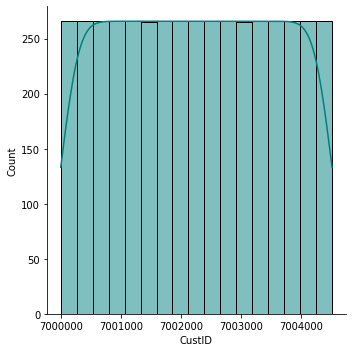

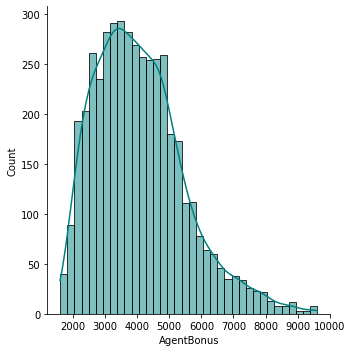

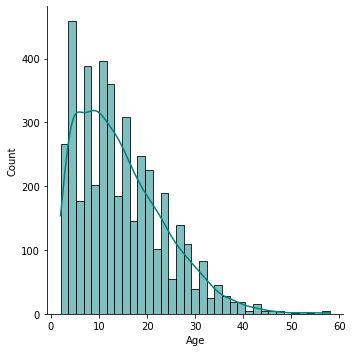

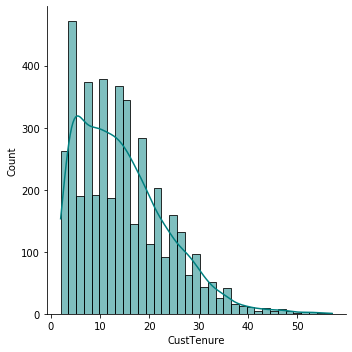

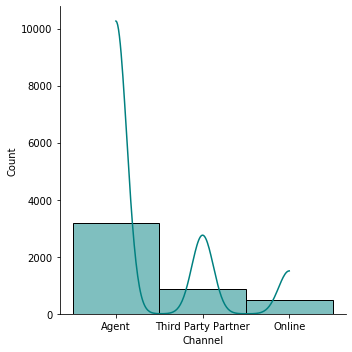

...

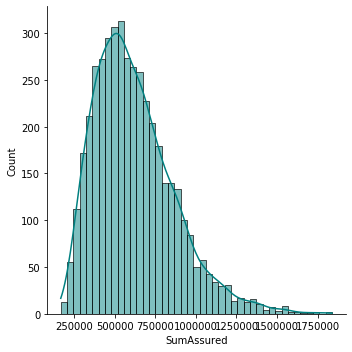

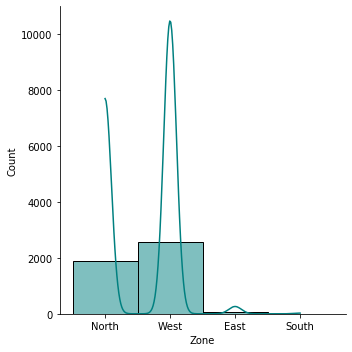

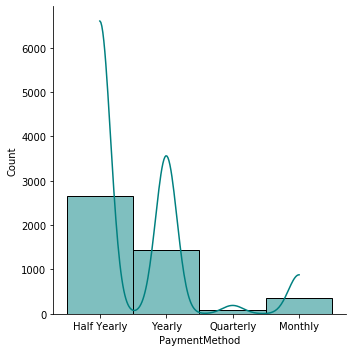

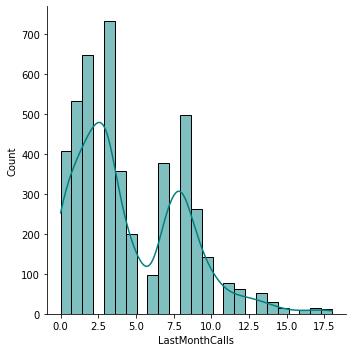

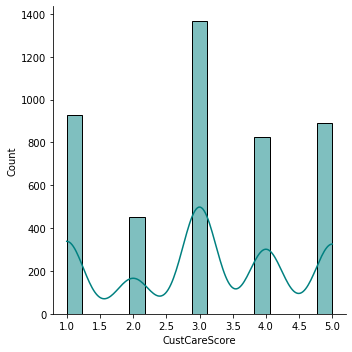

In [16]:
for col_val in df.columns:
    sns.displot(df[col_val],color='teal', kde='True')
    plt.show()

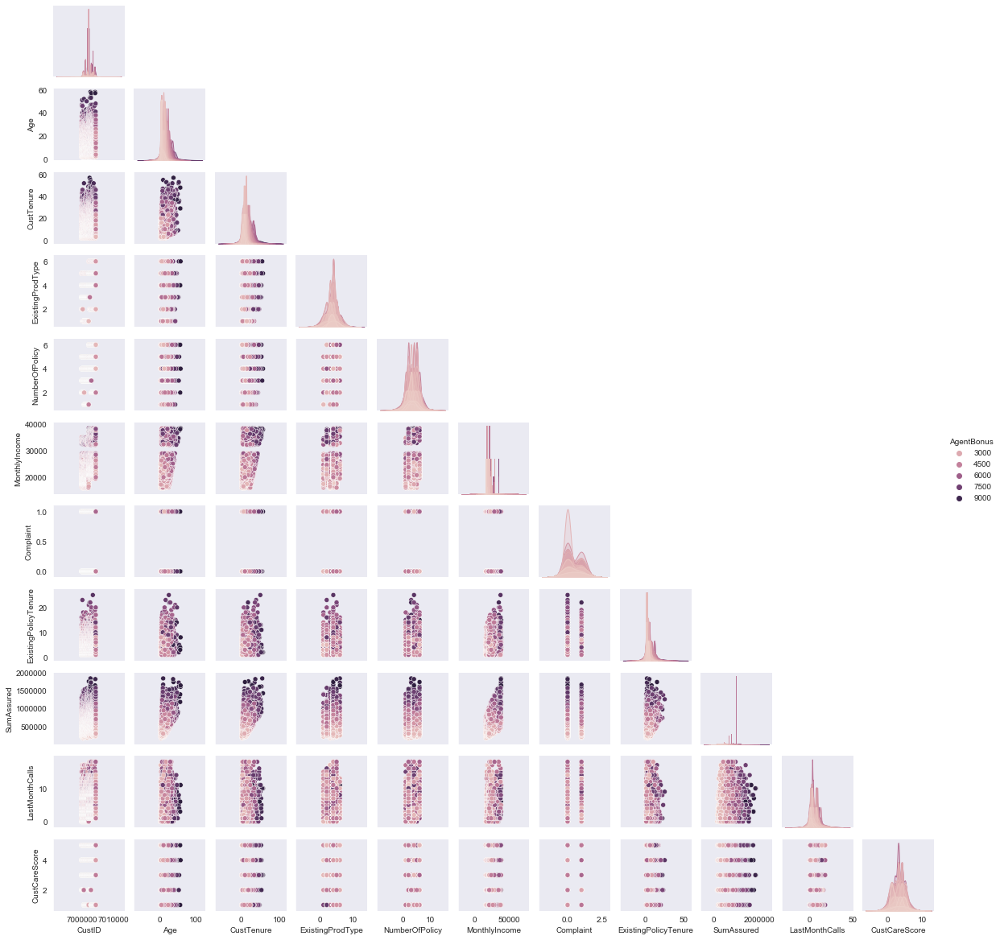

In [17]:
sns.set_style("dark")
sns.pairplot(df,hue='AgentBonus',height=1.5,aspect=1,corner=True)

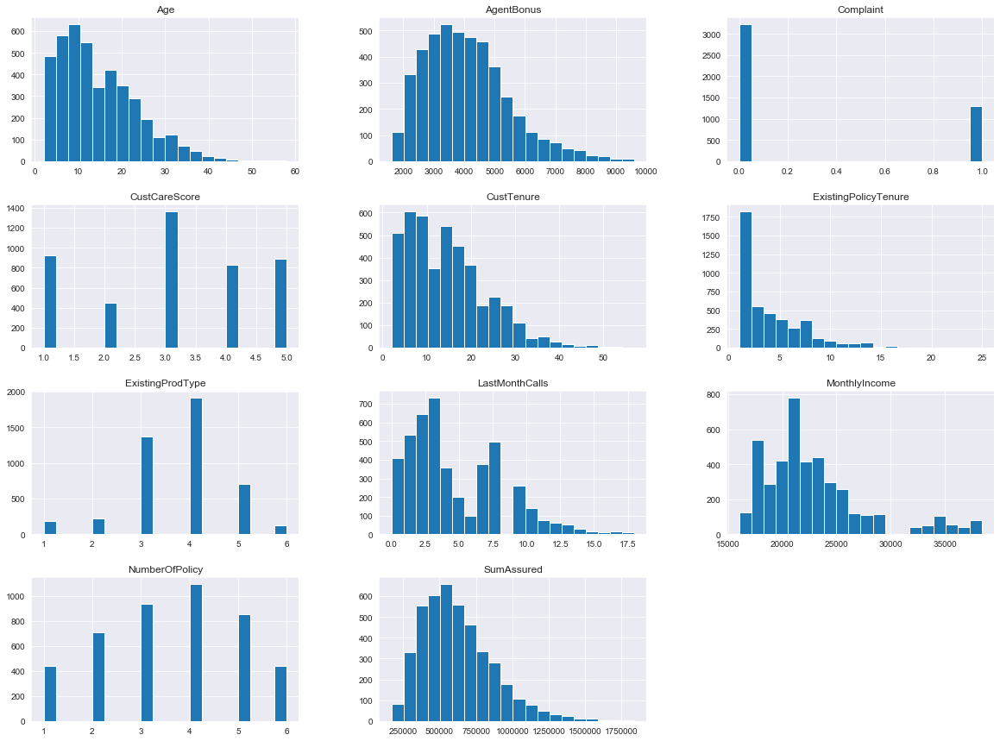

In [18]:
df.iloc[:, 1:].hist(figsize = (20,15),bins=20)
plt.show()

In [15]:
# display categorical
for i in df.columns:
    if df[i].dtype == 'object':
        print(i, ":" , df[i].unique())
        print('\n')



Channel : ['Agent' 'Third Party Partner' 'Online']


Occupation : ['Salaried' 'Free Lancer' 'Small Business' 'Large Business']


EducationField : ['Graduate' 'Post Graduate' 'Under Graduate' 'Engineer' 'Diploma' 'MBA']


Gender : ['Female' 'Male']


Designation : ['Manager' 'Executive' 'AVP-VP' 'Senior Manager']


MaritalStatus : ['Single/Unmarried' 'Divorced' 'Married']


Zone : ['North' 'West' 'East' 'South']


PaymentMethod : ['Half Yearly' 'Yearly' 'Quarterly' 'Monthly']




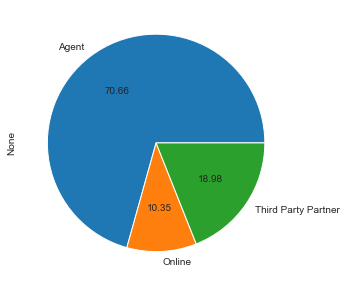

In [36]:
# pie chart for channel
df.groupby('Channel').size().plot(kind='pie', autopct='%.2f', figsize=(5, 5))


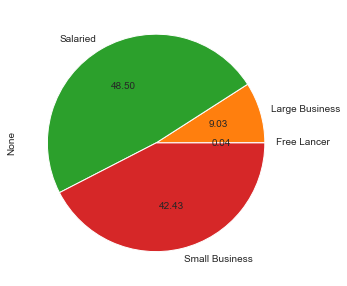

In [30]:
# pie chart for occupation
df.groupby('Occupation').size().plot(kind='pie', autopct='%.2f', figsize=(5, 5))

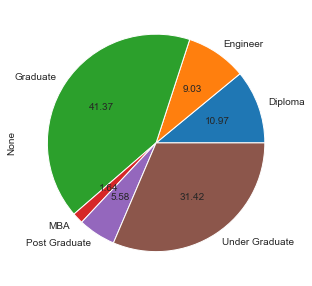

In [31]:

# pie chart for education field
df.groupby('EducationField').size().plot(kind='pie', autopct='%.2f', figsize=(5, 5))

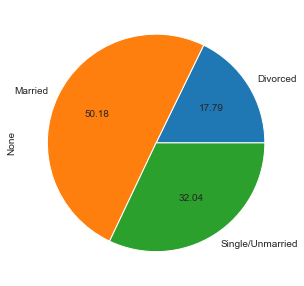

In [32]:
# pie chart for marital status
df.groupby('MaritalStatus').size().plot(kind='pie', autopct='%.2f', figsize=(5, 5))

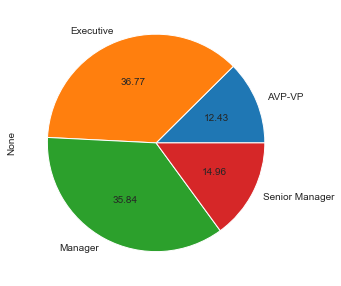

In [33]:
# pie chart for designation
df.groupby('Designation').size().plot(kind='pie', autopct='%.2f', figsize=(5, 5))

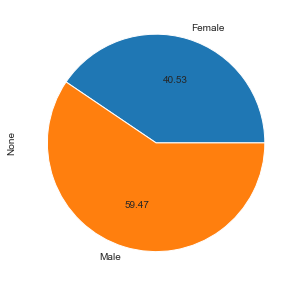

In [34]:
# pie chart for gender
df.groupby('Gender').size().plot(kind='pie', autopct='%.2f', figsize=(5, 5))

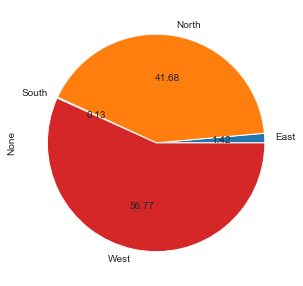

In [35]:
# piechart for zone
df.groupby('Zone').size().plot(kind='pie', autopct='%.2f', figsize=(5, 5))

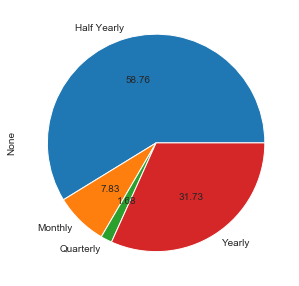

In [37]:
# piechart for paymentmethod
df.groupby('PaymentMethod').size().plot(kind='pie', autopct='%.2f', figsize=(5, 5))

# Bivariate Analysis

In [17]:
df.corr()

,CustID,AgentBonus,Age,CustTenure,ExistingProdType,NumberOfPolicy,MonthlyIncome,Complaint,ExistingPolicyTenure,SumAssured,LastMonthCalls,CustCareScore
CustID,1.00,0.19,0.09,0.11,0.42,0.26,0.31,0.00,0.10,0.16,0.12,-0.03
AgentBonus,0.19,1.00,0.56,0.56,0.11,0.08,0.61,0.01,0.39,0.85,0.20,0.02
Age,0.09,0.56,1.00,0.33,0.07,0.04,0.35,0.02,0.22,0.47,0.11,0.04
CustTenure,0.11,0.56,0.33,1.00,0.08,0.05,0.34,0.00,0.21,0.47,0.12,0.01
ExistingProdType,0.42,0.11,0.07,0.08,1.00,0.15,0.20,-0.00,0.06,0.10,0.03,0.00
NumberOfPolicy,0.26,0.08,0.04,0.05,0.15,1.00,0.14,-0.02,0.05,0.06,0.07,-0.00
MonthlyIncome,0.31,0.61,0.35,0.34,0.20,0.14,1.00,-0.00,0.22,0.51,0.36,0.04
Complaint,0.00,0.01,0.02,0.00,-0.00,-0.02,-0.00,1.00,0.00,-0.00,-0.03,-0.00
ExistingPolicyTenure,0.10,0.39,0.22,0.21,0.06,0.05,0.22,0.00,1.00,0.34,0.11,-0.01
SumAssured,0.16,0.85,0.47,0.47,0.10,0.06,0.51,-0.00,0.34,1.00,0.16,0.00


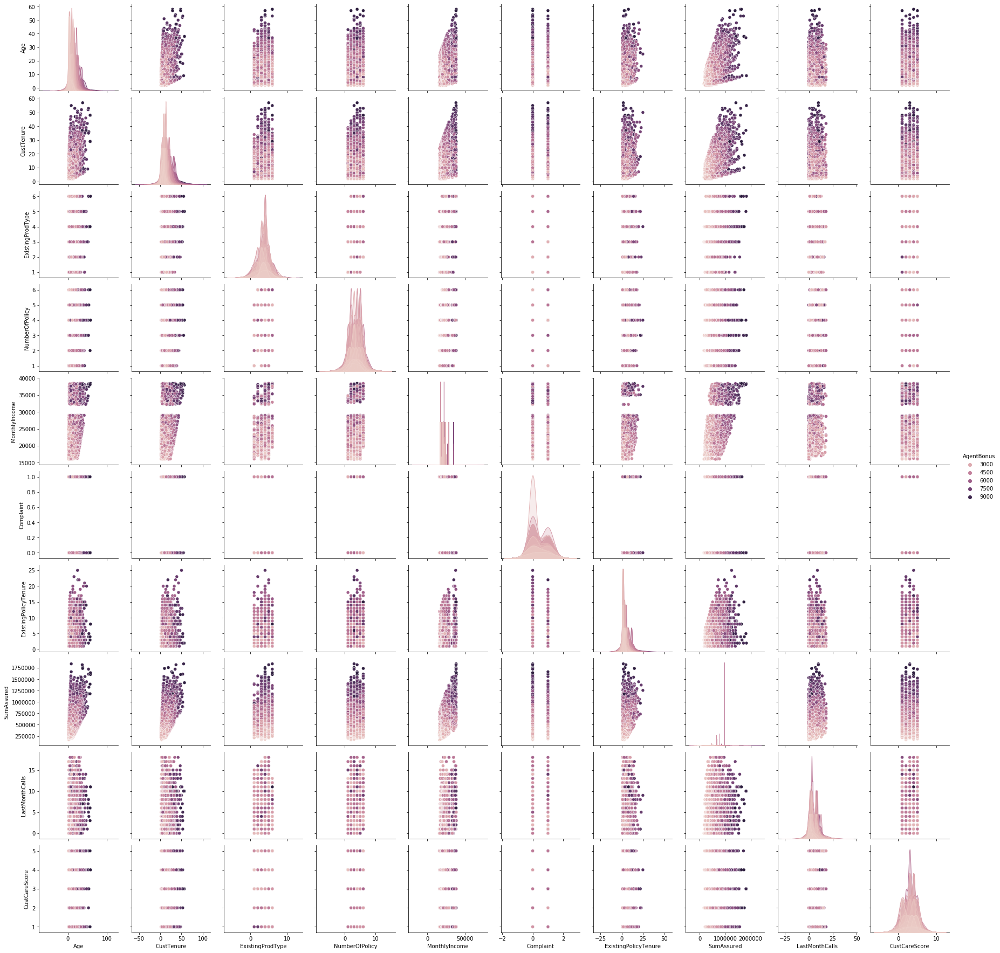

In [44]:
#pairplot of each variable w.r.t each variable
sns.pairplot(df.drop('CustID',axis=1),hue='AgentBonus', diag_kind = 'kde');

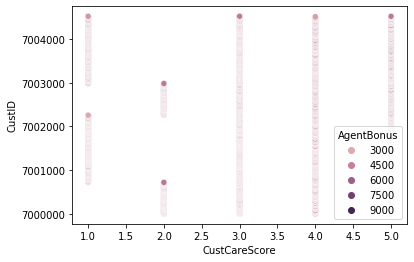

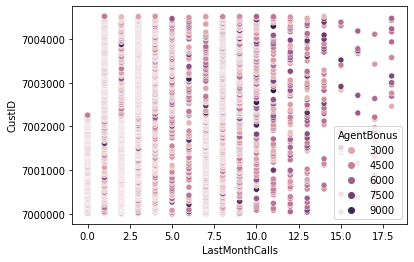

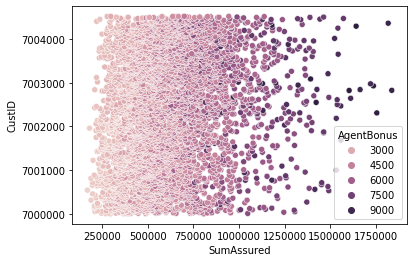

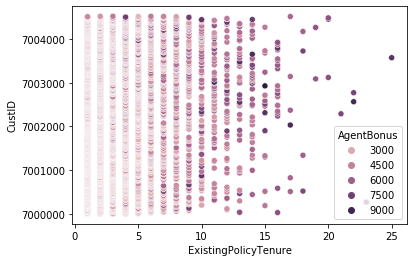

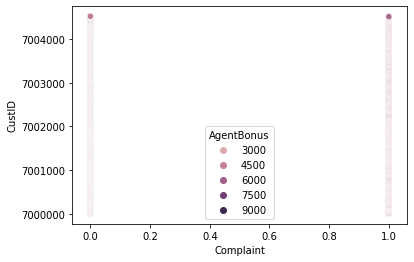

...

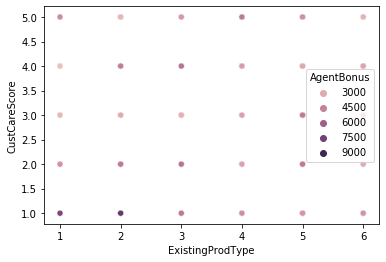

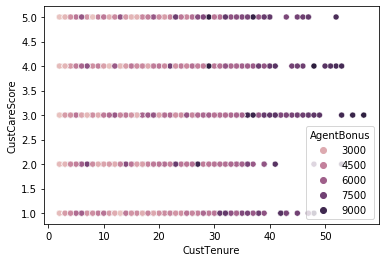

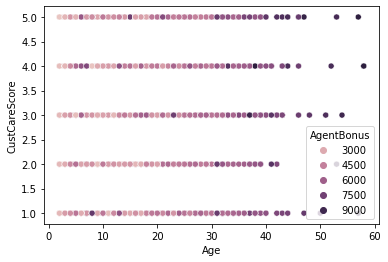

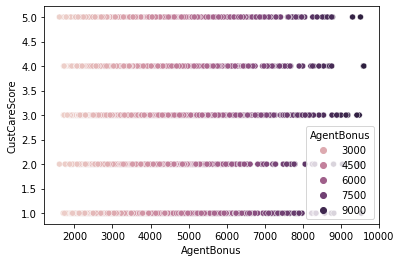

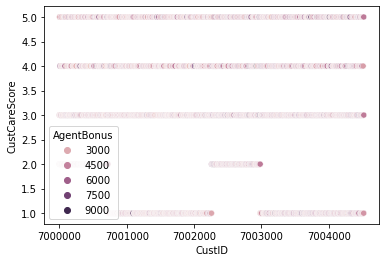

In [39]:
#scatterplot of each variable wrt each variable highlighting agent bonus
col_names = list(df.select_dtypes(exclude='object').columns)
for i, col_val in enumerate(col_names):
    for j,rev_col in reversed(list(enumerate(col_names))):
        sns.scatterplot(y=df[col_val],x=df[rev_col],hue=df.AgentBonus)
        plt.show()

In [46]:
df['Channel'].value_counts()

Agent                  3194
Third Party Partner     858
Online                  468
Name: Channel, dtype: int64

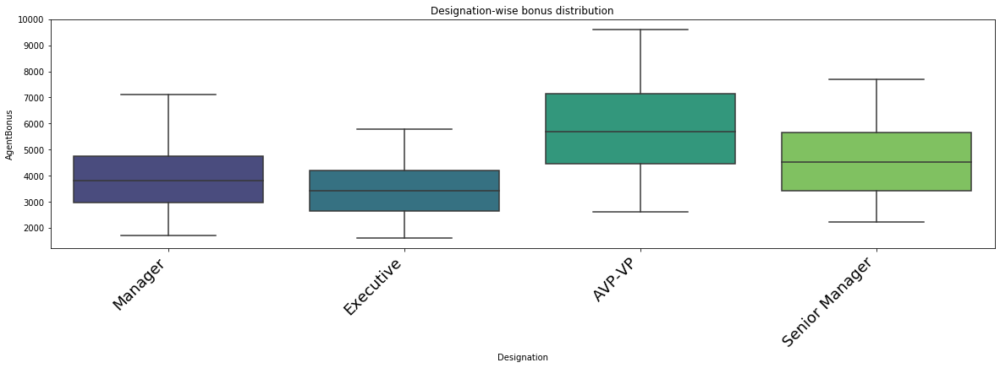

In [26]:
plt.figure(figsize=(20,5))

chart=sns.boxplot(x="Designation", y="AgentBonus", data=df, palette="viridis")
chart.set_xticklabels(chart.get_xticklabels(), rotation=45, horizontalalignment='right', fontsize=18)
plt.title('Designation-wise bonus distribution')
chart;

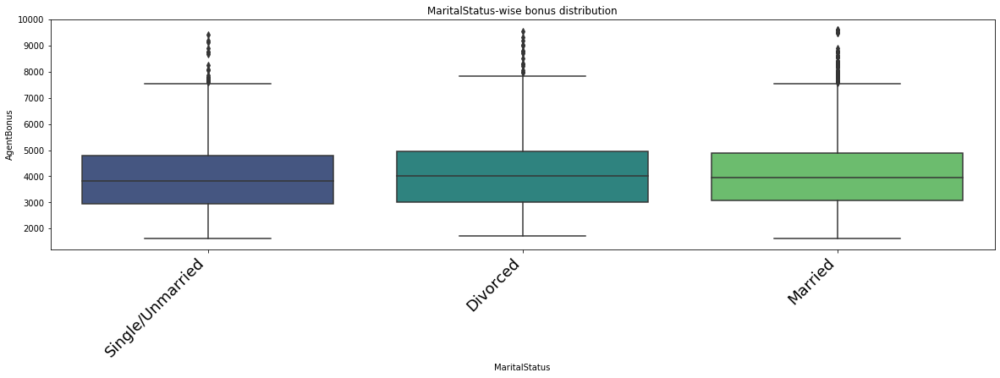

In [27]:
plt.figure(figsize=(20,5))

chart=sns.boxplot(x="MaritalStatus", y="AgentBonus", data=df, palette="viridis")
chart.set_xticklabels(chart.get_xticklabels(), rotation=45, horizontalalignment='right', fontsize=18)
plt.title('MaritalStatus-wise bonus distribution')
chart;

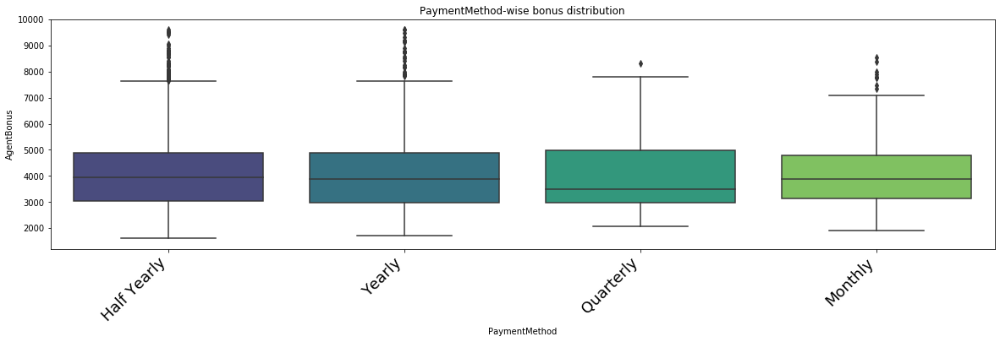

In [28]:
plt.figure(figsize=(20,5))

chart=sns.boxplot(x="PaymentMethod", y="AgentBonus", data=df, palette="viridis")
chart.set_xticklabels(chart.get_xticklabels(), rotation=45, horizontalalignment='right', fontsize=18)
plt.title('PaymentMethod-wise bonus distribution')
chart;

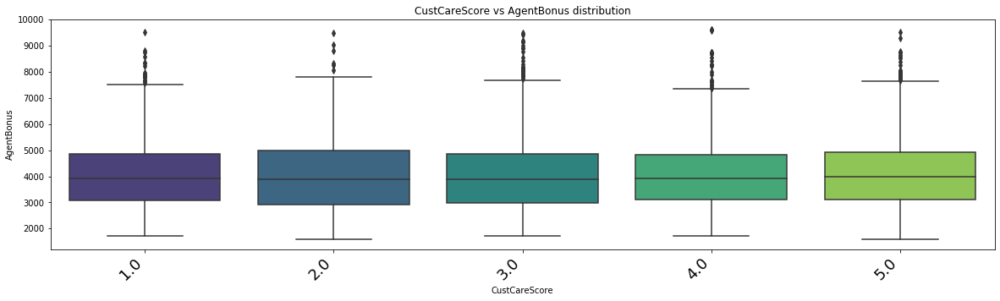

In [33]:
## Price does vary based on guests_included
plt.figure(figsize=(20,5))

chart=sns.boxplot(x="CustCareScore", y="AgentBonus", data=df, palette="viridis")
chart.set_xticklabels(chart.get_xticklabels(), rotation=45, horizontalalignment='right', fontsize=18)
plt.title('CustCareScore vs AgentBonus distribution')
chart;

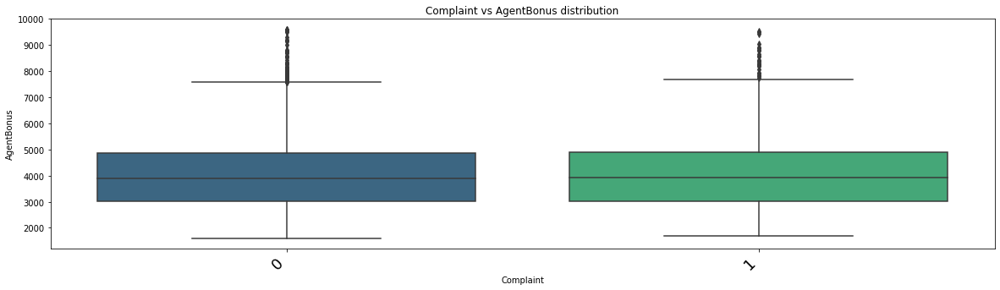

In [34]:
## Price does vary based on guests_included
plt.figure(figsize=(20,5))

chart=sns.boxplot(x="Complaint", y="AgentBonus", data=df, palette="viridis")
chart.set_xticklabels(chart.get_xticklabels(), rotation=45, horizontalalignment='right', fontsize=18)
plt.title('Complaint vs AgentBonus distribution')
chart;

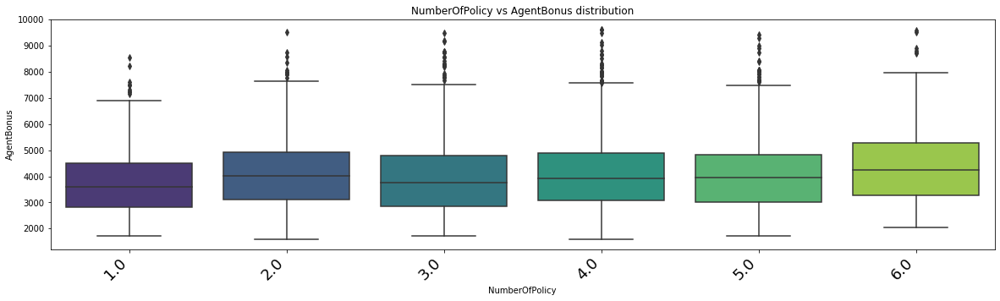

In [35]:
## Price does vary based on guests_included
plt.figure(figsize=(20,5))

chart=sns.boxplot(x="NumberOfPolicy", y="AgentBonus", data=df, palette="viridis")
chart.set_xticklabels(chart.get_xticklabels(), rotation=45, horizontalalignment='right', fontsize=18)
plt.title('NumberOfPolicy vs AgentBonus distribution')
chart;

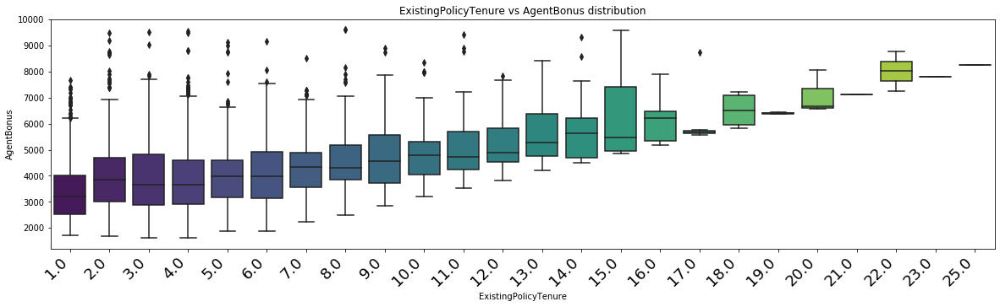

In [36]:
## Price does vary based on guests_included
plt.figure(figsize=(20,5))

chart=sns.boxplot(x="ExistingPolicyTenure", y="AgentBonus", data=df, palette="viridis")
chart.set_xticklabels(chart.get_xticklabels(), rotation=45, horizontalalignment='right', fontsize=18)
plt.title('ExistingPolicyTenure vs AgentBonus distribution')
chart;

# Removal of unwanted variables

In [48]:
#dropping unwanted variables
df.drop('CustID',axis=1,inplace=True)

In [51]:
df.head()

,AgentBonus,Age,CustTenure,Channel,Occupation,EducationField,Gender,ExistingProdType,Designation,NumberOfPolicy,MaritalStatus,MonthlyIncome,Complaint,ExistingPolicyTenure,SumAssured,Zone,PaymentMethod,LastMonthCalls,CustCareScore
0,4409,22.00,4.00,Agent,Salaried,Graduate,Female,3,Manager,2.00,Single/Unmarried,20993.00,1,2.00,806761.00,North,Half Yearly,5,2.00
1,2214,11.00,2.00,Third Party Partner,Salaried,Graduate,Male,4,Manager,4.00,Divorced,20130.00,0,3.00,294502.00,North,Yearly,7,3.00
2,4273,26.00,4.00,Agent,Free Lancer,Post Graduate,Male,4,Executive,3.00,Single/Unmarried,17090.00,1,2.00,nan,North,Yearly,0,3.00
3,1791,11.00,nan,Third Party Partner,Salaried,Graduate,Female,3,Executive,3.00,Divorced,17909.00,1,2.00,268635.00,West,Half Yearly,0,5.00
4,2955,6.00,nan,Agent,Small Business,Under Graduate,Male,3,Executive,4.00,Divorced,18468.00,0,4.00,366405.00,West,Half Yearly,2,5.00


## Checking for duplicates

In [53]:
#checking for duplicates
df.iloc[:, 1:].duplicated().sum()

0

# Missing Value Treatment

In [63]:
#checking for missing values
df.isna().sum()

AgentBonus              0
Age                     0
CustTenure              0
Channel                 0
Occupation              0
EducationField          0
Gender                  0
ExistingProdType        0
Designation             0
NumberOfPolicy          0
MaritalStatus           0
MonthlyIncome           0
Complaint               0
ExistingPolicyTenure    0
SumAssured              0
Zone                    0
PaymentMethod           0
LastMonthCalls          0
CustCareScore           0
dtype: int64

In [62]:
print('There are ', df.isnull().sum().sum(),'missing values in the dataset')

There are  0 missing values in the dataset


In [55]:
#Substituing Missing values for MonthlyIncome
df.groupby('Designation').mean()['MonthlyIncome']

Designation
AVP-VP           34377.11
Executive        19509.68
Manager          22228.97
Senior Manager   25846.51
Name: MonthlyIncome, dtype: float64

In [56]:
np.where(df.Designation == 'AVP-VP', df.MonthlyIncome, df.MonthlyIncome.fillna(34377.1, inplace = True))

np.where(df.Designation == 'Senior Manager', df.MonthlyIncome, df.MonthlyIncome.fillna(25846.5, inplace = True))

array([None, None, None, ..., None, None, None], dtype=object)

In [58]:
#Mean value imputation for missing values
df.ExistingPolicyTenure.fillna(df.ExistingPolicyTenure.mean(), inplace=True)
df.SumAssured.fillna(df.SumAssured.mean(), inplace=True)
df.Age.fillna(df.Age.mean(), inplace=True)
df.CustTenure.fillna(df.CustTenure.mean(), inplace=True)

In [59]:
#Mode value imputation for missing values
df.NumberOfPolicy.fillna(4, inplace=True)
df.CustCareScore.fillna(3, inplace=True)

In [60]:
df.isna().sum()

AgentBonus              0
Age                     0
CustTenure              0
Channel                 0
Occupation              0
EducationField          0
Gender                  0
ExistingProdType        0
Designation             0
NumberOfPolicy          0
MaritalStatus           0
MonthlyIncome           0
Complaint               0
ExistingPolicyTenure    0
SumAssured              0
Zone                    0
PaymentMethod           0
LastMonthCalls          0
CustCareScore           0
dtype: int64

# Outlier Treatment

In [67]:
cat=[]
num=[]
for i in df.columns:
    if df[i].dtype=="object":
        cat.append(i)
    else:
        num.append(i)
print(cat) 
print(num)

['Channel', 'Occupation', 'EducationField', 'Gender', 'Designation', 'MaritalStatus', 'Zone', 'PaymentMethod']
['AgentBonus', 'Age', 'CustTenure', 'ExistingProdType', 'NumberOfPolicy', 'MonthlyIncome', 'Complaint', 'ExistingPolicyTenure', 'SumAssured', 'LastMonthCalls', 'CustCareScore']


In [72]:
#Outliers count
Q1 = df[num].quantile(0.25)
Q3 = df[num].quantile(0.75)
IQR = Q3 - Q1
((df[num] < (Q1 - 1.5 * IQR)) | (df[num] > (Q3 + 1.5 * IQR))).sum()


AgentBonus              100
Age                     105
CustTenure               97
ExistingProdType        306
NumberOfPolicy            0
MonthlyIncome           545
Complaint                 0
ExistingPolicyTenure    345
SumAssured              110
LastMonthCalls           12
CustCareScore             0
dtype: int64

We will treat MonthlyIncome, CustTenure, ExistingPolicyTenure, SumAssured, LastMonthCalls and ExistingProdType only.
We dont treat Age or AgentBonus as for Age, it is very normal to have outliers and if we treat AgentBonus it might give us inaccurate results when ML model is going to be used.

In [73]:
#remove outliers
def remove_outliers(col):
    upper = df[col].quantile(0.75)
    lower = df[col].quantile(0.25) 
    IQR = df[col].quantile(0.75) - df[col].quantile(0.25) 
    df[col] = np.where(df[col] < (lower - 1.5*IQR) , (lower - 1.5*IQR), df[col])
    df[col] = np.where(df[col] > (lower + 1.5*IQR) , (lower + 1.5*IQR), df[col])

In [74]:
remove_outliers('MonthlyIncome') 
remove_outliers('CustTenure') 
remove_outliers('ExistingPolicyTenure') 
remove_outliers('SumAssured')

In [75]:
Q1 = df[num].quantile(0.25)
Q3 = df[num].quantile(0.75)
IQR = Q3 - Q1
((df[num] < (Q1 - 1.5 * IQR)) | (df[num] > (Q3 + 1.5 * IQR))).sum()

AgentBonus              100
Age                     105
CustTenure                0
ExistingProdType        306
NumberOfPolicy            0
MonthlyIncome             0
Complaint                 0
ExistingPolicyTenure      0
SumAssured                0
LastMonthCalls           12
CustCareScore             0
dtype: int64

In [78]:
remove_outliers('ExistingProdType')
remove_outliers('LastMonthCalls')

In [79]:
#treating outliers
Q1 = df[num].quantile(0.25)
Q3 = df[num].quantile(0.75)
IQR = Q3 - Q1
((df[num] < (Q1 - 1.5 * IQR)) | (df[num] > (Q3 + 1.5 * IQR))).sum()

AgentBonus              100
Age                     105
CustTenure                0
ExistingProdType          0
NumberOfPolicy            0
MonthlyIncome             0
Complaint                 0
ExistingPolicyTenure      0
SumAssured                0
LastMonthCalls            0
CustCareScore             0
dtype: int64

# Clustering

In [80]:
from sklearn.cluster import KMeans
wss = []

In [95]:
df_new =pd.get_dummies(df, columns=cat,drop_first=True)
X = df_new.drop('AgentBonus', axis=1)

In [96]:
from scipy.stats import zscore
df_scaled=X.apply(zscore)

In [102]:
df_scaled.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,4520.00,-0.00,1.00,-1.43,-0.74,-0.06,0.51,4.96
CustTenure,4520.00,0.00,1.00,-1.66,-0.81,0.05,0.77,1.56
ExistingProdType,4520.00,-0.00,1.00,-2.63,-0.74,0.52,0.52,1.15
NumberOfPolicy,4520.00,0.00,1.00,-1.77,-1.08,0.30,0.99,1.68
MonthlyIncome,4520.00,0.00,1.00,-1.84,-0.75,-0.18,0.78,1.55
Complaint,4520.00,0.00,1.00,-0.63,-0.63,-0.63,1.58,1.58
ExistingPolicyTenure,4520.00,-0.00,1.00,-1.25,-0.75,-0.26,0.73,1.47
SumAssured,4520.00,0.00,1.00,-2.22,-0.79,-0.04,0.79,1.58
LastMonthCalls,4520.00,0.00,1.00,-1.35,-0.75,-0.45,1.05,1.95
CustCareScore,4520.00,-0.00,1.00,-1.50,-0.78,-0.05,0.68,1.41


In [103]:
k_means = KMeans(n_clusters = 2)
k_means.fit(df_scaled)
k_means.inertia_

130842.10715925667

In [99]:
wss = []
for i in range(1,11):
    KM = KMeans(n_clusters=i)
    KM.fit(df_scaled)
    wss.append(KM.inertia_)
    print('wss for '+ str(i)+ ' clusters is : ' +str(KM.inertia_))

wss for 1 clusters is : 144640.0000000002
wss for 2 clusters is : 130842.10715925667
wss for 3 clusters is : 120652.21182755403
wss for 4 clusters is : 115492.70959321441
wss for 5 clusters is : 110982.6842848869
wss for 6 clusters is : 107258.53775176994
wss for 7 clusters is : 102990.77421467265
wss for 8 clusters is : 100447.99098159655
wss for 9 clusters is : 96414.9514872792
wss for 10 clusters is : 93664.33275824139


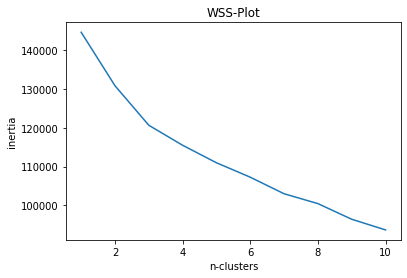

In [101]:
plt.plot(range(1,11), wss)
plt.xlabel('n-clusters')
plt.ylabel('inertia')
plt.title('WSS-Plot')
plt.show()

You can see elbow at two places : cluster 3 and cluster 7

In [106]:
df.describe()

,AgentBonus,Age,CustTenure,ExistingProdType,NumberOfPolicy,MonthlyIncome,Complaint,ExistingPolicyTenure,SumAssured,LastMonthCalls,CustCareScore
count,4520.00,4520.00,4520.00,4520.00,4520.00,4520.00,4520.00,4520.00,4520.00,4520.00,4520.00
mean,4077.84,14.49,13.62,3.59,3.57,22520.77,0.29,3.53,597426.36,4.51,3.07
std,1403.32,8.76,6.98,0.79,1.45,3544.46,0.45,2.03,193304.44,3.33,1.38
min,1605.00,2.00,2.00,1.50,1.00,16009.00,0.00,1.00,168536.00,0.00,1.00
25%,3027.75,8.00,8.00,3.00,2.00,19858.00,0.00,2.00,444476.25,2.00,2.00
50%,3911.50,14.00,14.00,4.00,4.00,21877.00,0.00,3.00,590012.50,3.00,3.00
75%,4867.25,19.00,19.00,4.00,5.00,25290.25,1.00,5.00,750010.50,8.00,4.00
max,9608.00,58.00,24.50,4.50,6.00,28006.38,1.00,6.50,902777.62,11.00,5.00


C:\Users\KIIT\Anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


ValueError: Could not interpret input 'Cluster'

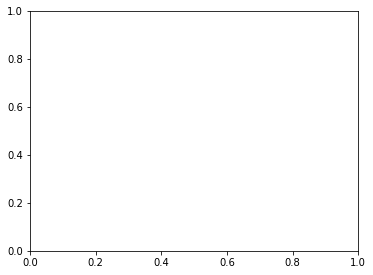

In [107]:
i= 1

for col in df.columns:
    if(df[col].dtype == 'object'):
        fig = plt.figure(figsize= (20,15))
        ax = plt.subplot(3,3, i)
        sns.countplot('Cluster', hue = df[col], ax = ax,linewidth=10, data = df)
        plt.show()
        print(df[col].value_counts(normalize= True))
        i = i+1

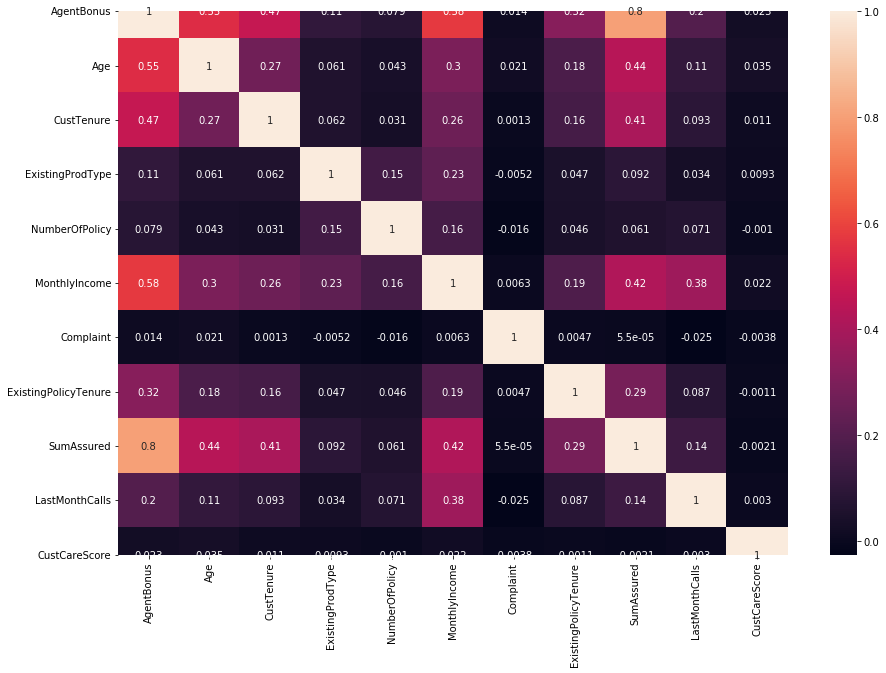

In [109]:
#plotting the heatmap for relations between variables
plt.figure(figsize=(15,10))
sns.heatmap(df.corr(),annot=True,square=False)